In [11]:
import os
import random
import time
import collections
import itertools
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import pickle
import seaborn as sns
from functools import partial

from IPython.display import HTML
from scipy.stats import entropy
from innvariant_dgl.dataset import graph_to_construction_sequence, construction_sequence_to_graph, construction_sequence_evolution
from tqdm import tqdm

In [2]:
with open('deepgg-combined.pkl', 'rb') as read_handle:
    C = pickle.load(read_handle)

In [3]:
keys = list(C.keys())
keys_dfs = [key for key in keys if '_dfs' in key]
keys_bfs = [key for key in keys if '_bfs' in key]
keys_process = [key for key in keys if '_process' in key]
keys_erdos_renyi = [key for key in keys if 'erdos_renyi' in key]
keys_barabasi_albert = [key for key in keys if 'barabasi_albert' in key]
keys_watts_strogatz = [key for key in keys if 'watts_strogatz' in key]
keys_er_and_bfs = [key for key in keys if 'erdos_renyi' in key and '_bfs' in key]
keys_er_and_dfs = [key for key in keys if 'erdos_renyi' in key and '_dfs' in key]
keys_ba_and_bfs = [key for key in keys if 'barabasi_albert' in key and '_bfs' in key]
keys_ba_and_dfs = [key for key in keys if 'barabasi_albert' in key and '_dfs' in key]
keys_ws_and_bfs = [key for key in keys if 'watts_strogatz' in key and '_bfs' in key]
keys_ws_and_dfs = [key for key in keys if 'watts_strogatz' in key and '_dfs' in key]

subsets = {
    'Depth-First-Search': keys_dfs,
    'Breadth-First-Search': keys_bfs,
    'Construction Process': keys_process,
    'Erdos-Renyi model': keys_erdos_renyi,
    'Barabasi-Albert model': keys_barabasi_albert,
    'Watts-Strogatz model': keys_watts_strogatz,
    'Erdos-Renyi + BFS': keys_er_and_bfs,
    'Erdos-Renyi + DFS': keys_er_and_dfs,
    'Barabasi-Albert + BFS': keys_ba_and_bfs,
    'Barabasi-Albert + DFS': keys_ba_and_dfs,
    'Watts-Strogatz + BFS': keys_ws_and_bfs,
    'Watts-Strogatz + DFS': keys_ws_and_dfs,
}

In [14]:
layout_circular = partial(nx.circular_layout, scale=1, center=None, dim=2)

In [12]:
def plot_samples(model_keys: list, samples_per_deepgg_instance = 8, plots_per_row = 4, layout=None):
    num_rows = int(np.ceil(samples_per_deepgg_instance / plots_per_row))
    for key in model_keys:
        print('DeepGG model instance "%s"' % key)

        fig, axes = plt.subplots(num_rows, plots_per_row, figsize=(20, num_rows * 2))

        plot_idx = 0
        for plot_idx in range(samples_per_deepgg_instance):
            cur_graph = None
            while cur_graph is None:
                con_seq = random.sample(C[key]['generated_cs'], 1)[0]
                cur_graph = construction_sequence_to_graph(con_seq)

                if len(cur_graph) < 5:
                    cur_graph = None
                else:
                    # Take largest connected component for plotting
                    cur_graph = cur_graph.subgraph(max(nx.connected_components(cur_graph), key=len))

            cur_row = int(np.floor(plot_idx/plots_per_row))
            cur_col = int(plot_idx%plots_per_row)
            cur_ax = axes[cur_row, cur_col]

            if layout is None:
                layout = partial(nx.spring_layout, iterations=100)
            pos = layout(cur_graph)
            nx.draw(cur_graph, pos, ax=cur_ax)

        plt.show()

DeepGG model instance "deepgg-t1590574353-metadata-generate_seqs_barabasi_albert_dfs.json"


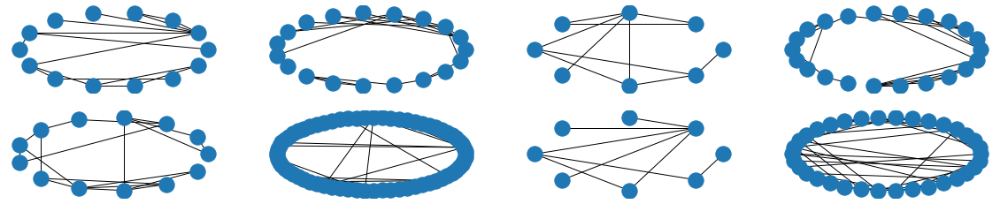

DeepGG model instance "deepgg-t1590408078-metadata-generate_seqs_barabasi_albert_dfs.json"


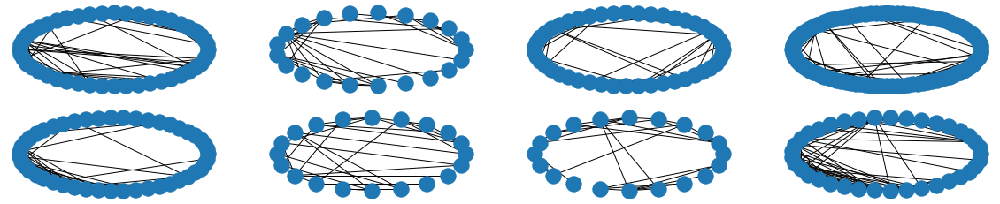

DeepGG model instance "deepgg-t1590574333-metadata-generate_seqs_barabasi_albert_process.json"


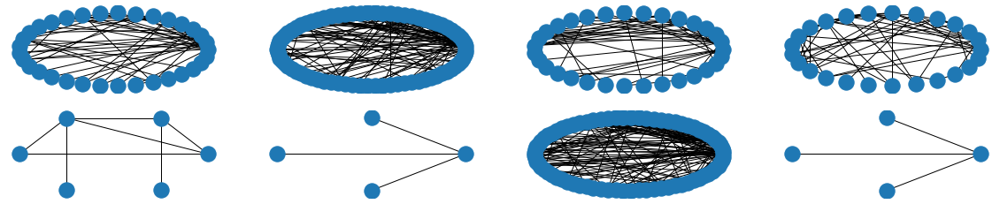

DeepGG model instance "deepgg-t1590175789-metadata-generate_seqs_barabasi_albert_process.json"


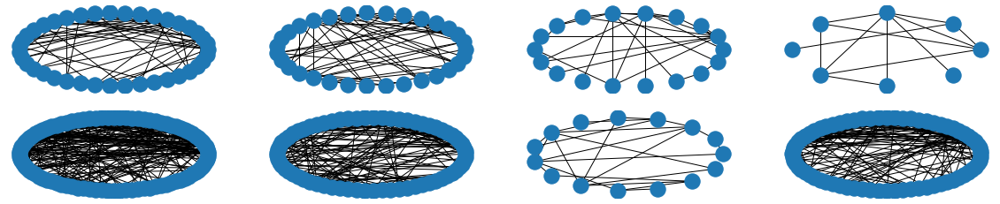

DeepGG model instance "deepgg-t1590175787-metadata-generate_seqs_barabasi_albert_dfs.json"


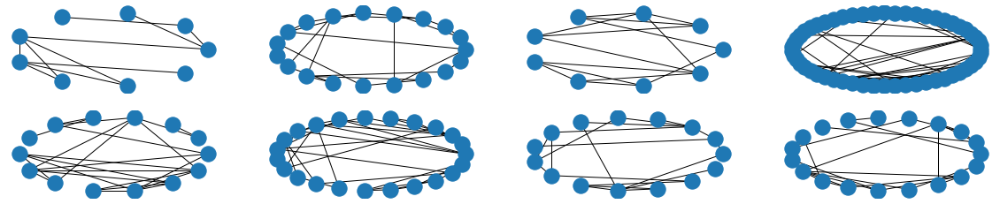

DeepGG model instance "deepgg-t1590414072-metadata-generate_seqs_barabasi_albert_dfs.json"


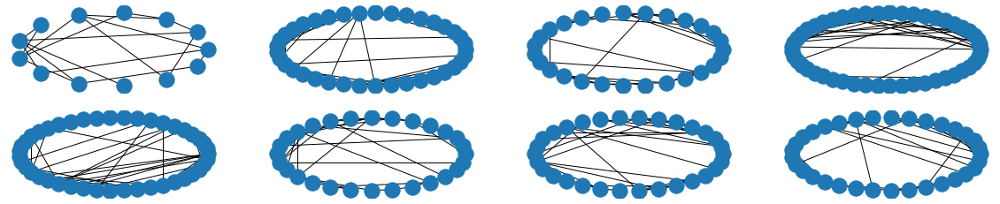

DeepGG model instance "deepgg-t1589810140-metadata-generate_seqs_barabasi_albert_dfs.json"


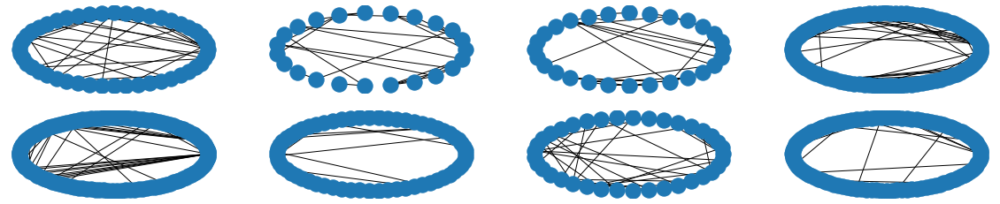

DeepGG model instance "deepgg-t1590175785-metadata-generate_seqs_barabasi_albert_process.json"


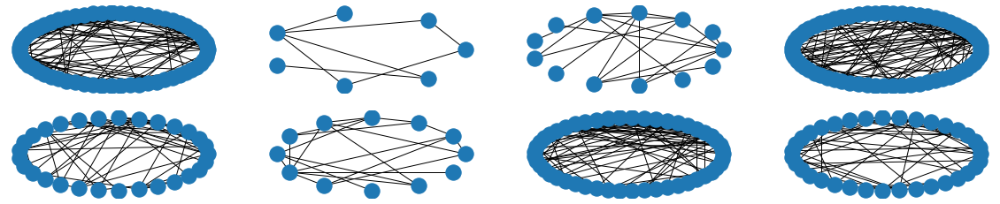

DeepGG model instance "deepgg-t1590408179-metadata-generate_seqs_barabasi_albert_dfs.json"


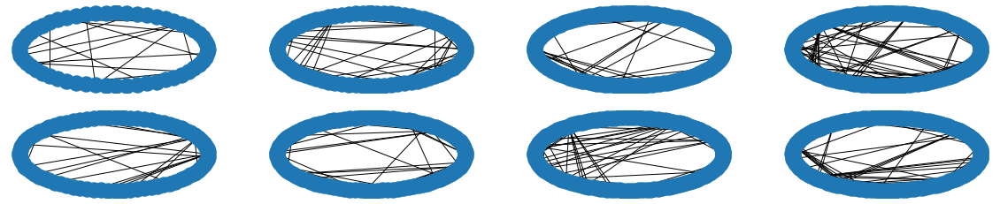

DeepGG model instance "deepgg-t1589810138-metadata-generate_seqs_barabasi_albert_dfs.json"


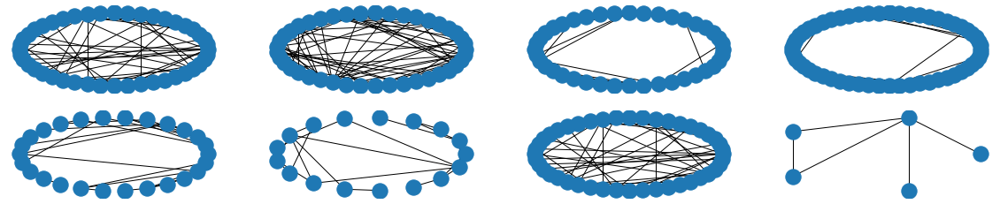

DeepGG model instance "deepgg-t1590408184-metadata-generate_seqs_barabasi_albert_bfs.json"


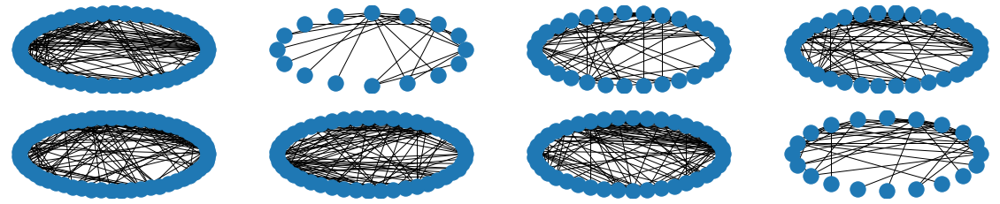

DeepGG model instance "deepgg-t1590574296-metadata-generate_seqs_barabasi_albert_dfs.json"


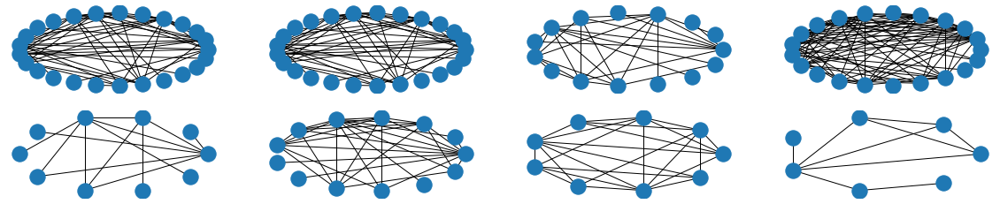

DeepGG model instance "deepgg-t1590680741-metadata-generate_seqs_barabasi_albert_bfs.json"


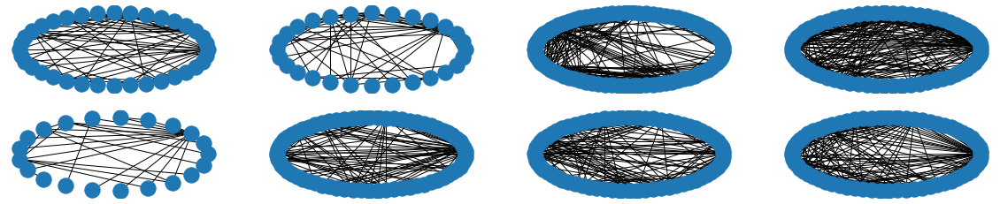

DeepGG model instance "deepgg-t1590408015-metadata-generate_seqs_barabasi_albert_dfs.json"


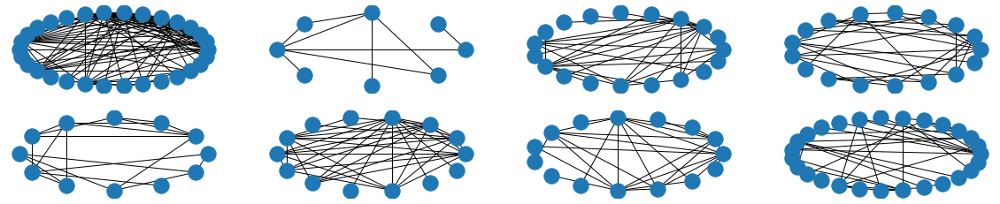

DeepGG model instance "deepgg-t1590408162-metadata-generate_seqs_barabasi_albert_bfs.json"


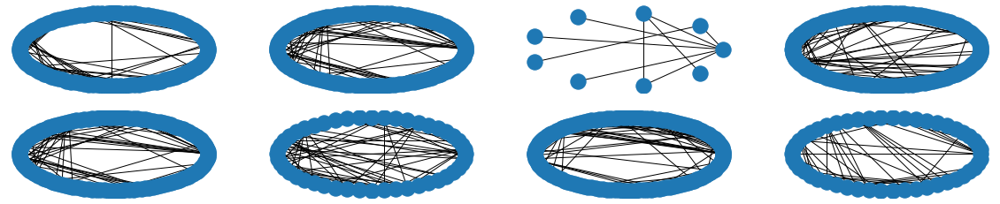

DeepGG model instance "deepgg-t1590574300-metadata-generate_seqs_barabasi_albert_dfs.json"


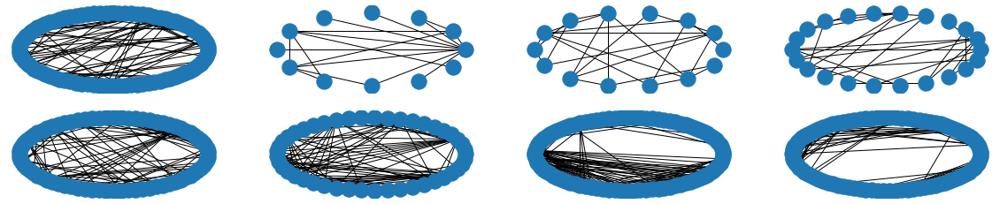

DeepGG model instance "deepgg-t1590680729-metadata-generate_seqs_barabasi_albert_process.json"


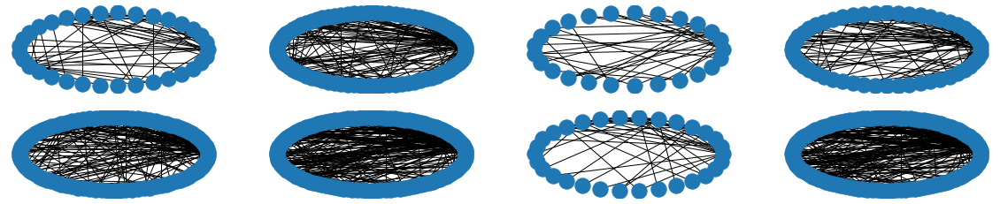

DeepGG model instance "deepgg-t1590414138-metadata-generate_seqs_barabasi_albert_dfs.json"


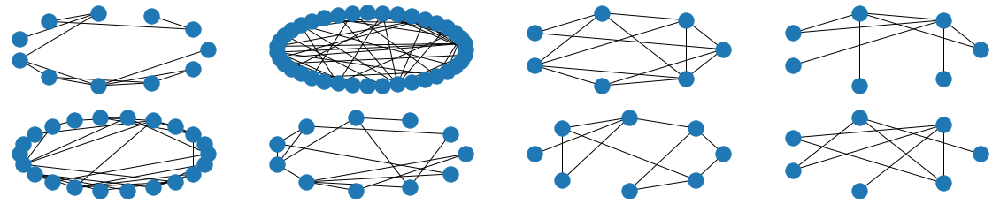

DeepGG model instance "deepgg-t1590408156-metadata-generate_seqs_barabasi_albert_dfs.json"


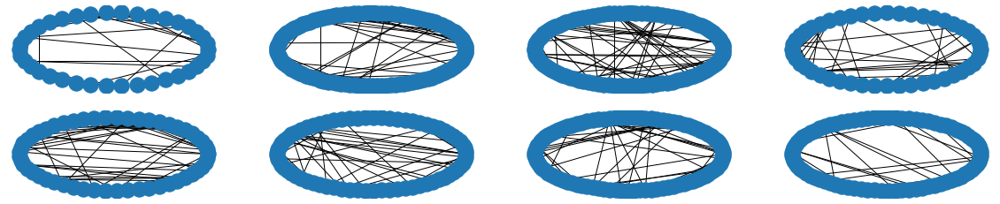

DeepGG model instance "deepgg-t1590175784-metadata-generate_seqs_barabasi_albert_dfs.json"


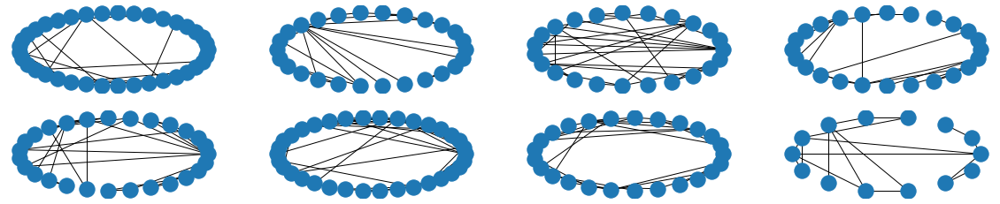

DeepGG model instance "deepgg-t1589299685-metadata-generate_seqs_barabasi_albert_dfs.json"


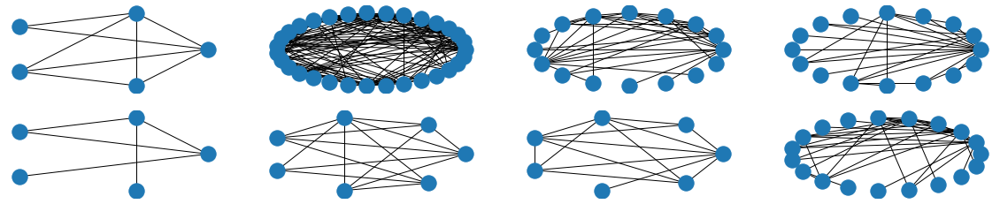

DeepGG model instance "deepgg-t1590412768-metadata-generate_seqs_barabasi_albert_dfs.json"


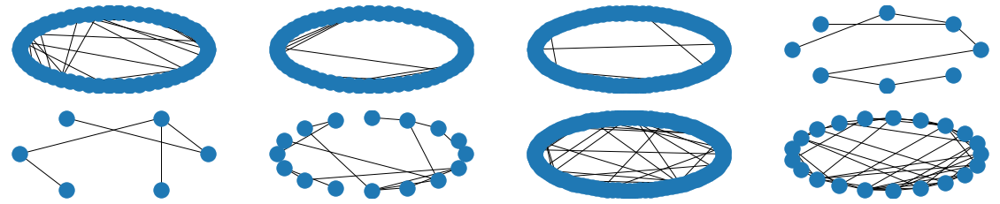

DeepGG model instance "deepgg-t1590574350-metadata-generate_seqs_barabasi_albert_dfs.json"


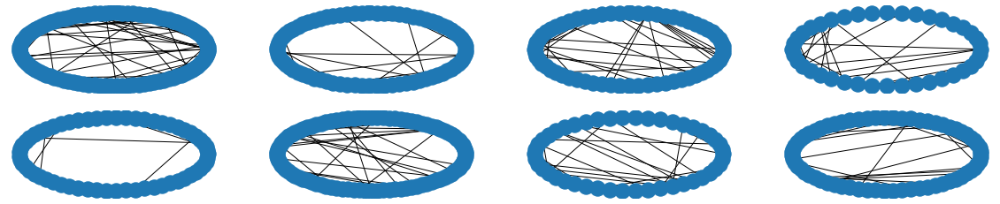

DeepGG model instance "deepgg-t1590680733-metadata-generate_seqs_barabasi_albert_process.json"


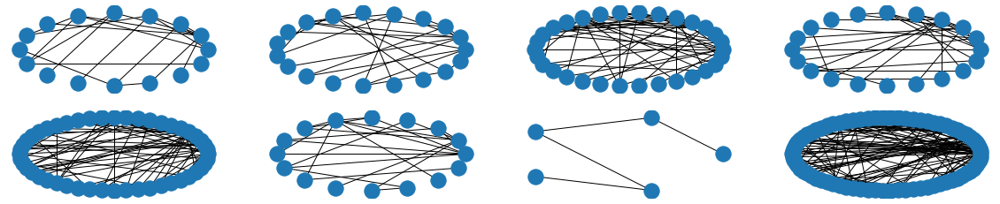

DeepGG model instance "deepgg-t1589473681-metadata-generate_seqs_barabasi_albert_process.json"


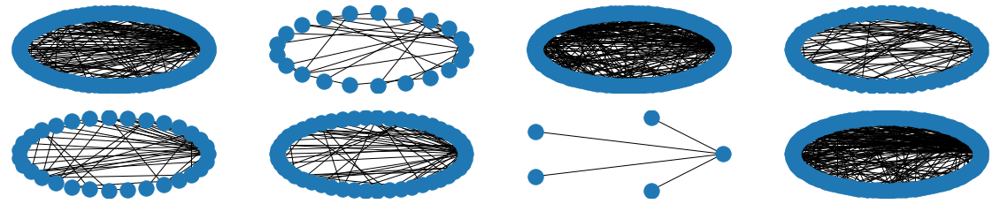

DeepGG model instance "deepgg-t1589473704-metadata-generate_seqs_barabasi_albert_bfs.json"


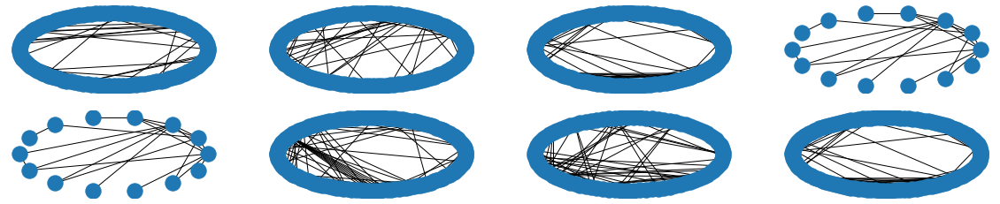

In [17]:
plot_samples(keys_barabasi_albert, layout=layout_circular)

DeepGG model instance "deepgg-t1589810152-metadata-generate_seqs_watts_strogatz_dfs.json"


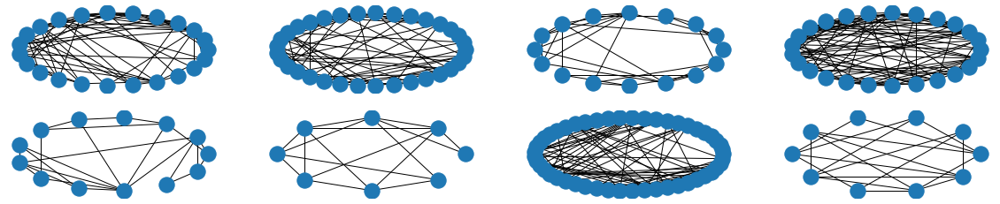

DeepGG model instance "deepgg-t1590680739-metadata-generate_seqs_watts_strogatz_bfs.json"


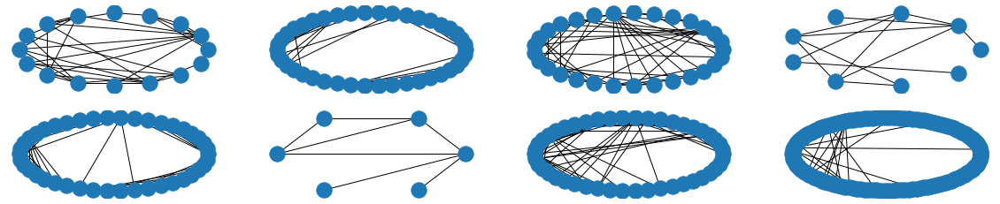

DeepGG model instance "deepgg-t1590680745-metadata-generate_seqs_watts_strogatz_bfs.json"


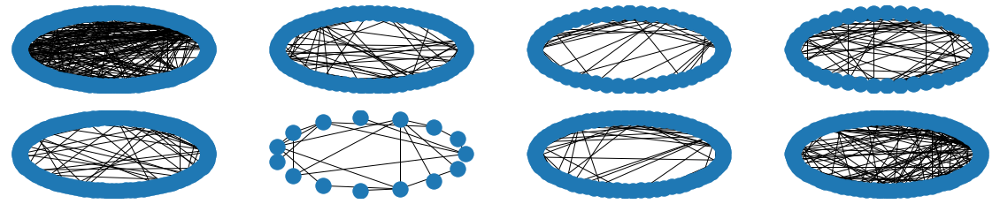

DeepGG model instance "deepgg-t1590408116-metadata-generate_seqs_watts_strogatz_dfs.json"


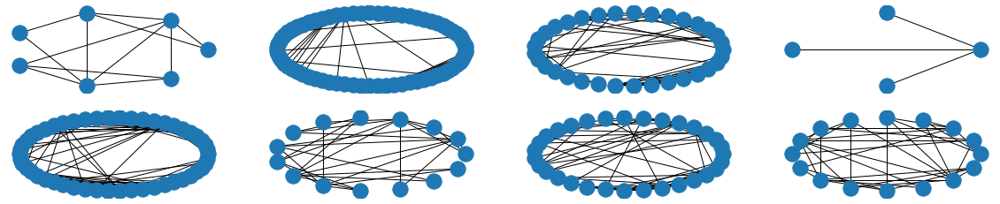

DeepGG model instance "deepgg-t1590408146-metadata-generate_seqs_watts_strogatz_dfs.json"


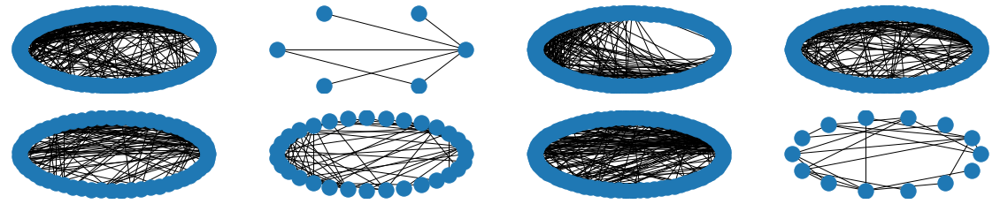

DeepGG model instance "deepgg-t1590574430-metadata-generate_seqs_watts_strogatz_dfs.json"


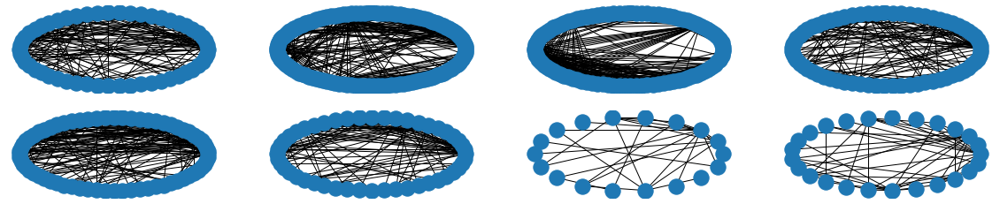

DeepGG model instance "deepgg-t1590574324-metadata-generate_seqs_watts_strogatz_bfs.json"


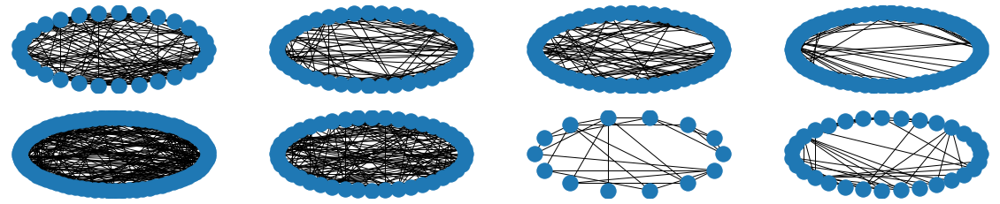

DeepGG model instance "deepgg-t1589365140-metadata-generate_seqs_watts_strogatz_bfs.json"


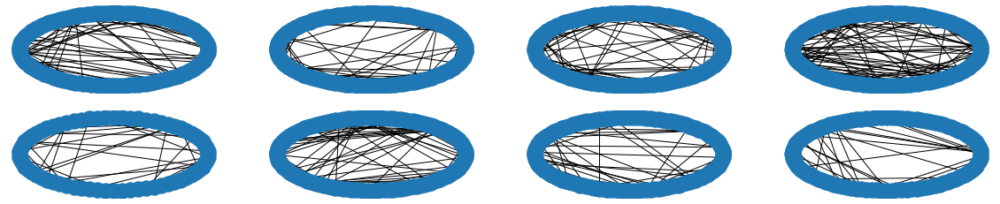

DeepGG model instance "deepgg-t1590175784-metadata-generate_seqs_watts_strogatz_dfs.json"


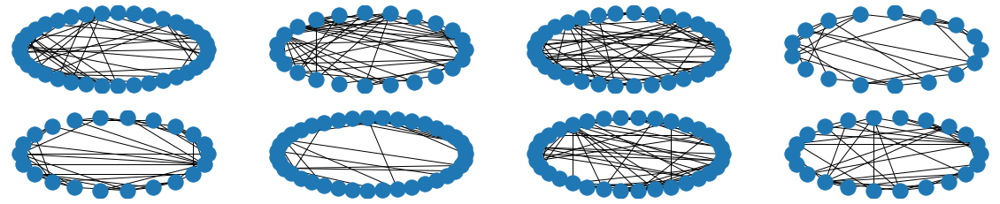

DeepGG model instance "deepgg-t1589366340-metadata-generate_seqs_watts_strogatz_dfs.json"


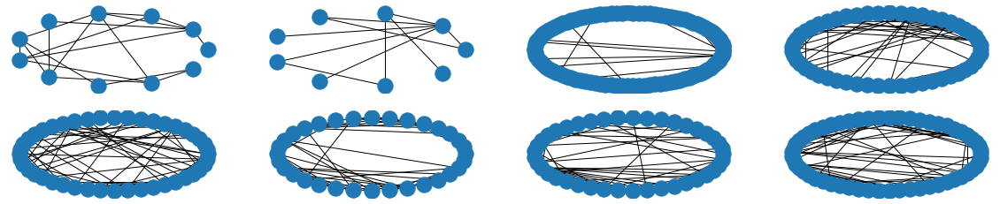

DeepGG model instance "deepgg-t1590414133-metadata-generate_seqs_watts_strogatz_dfs.json"


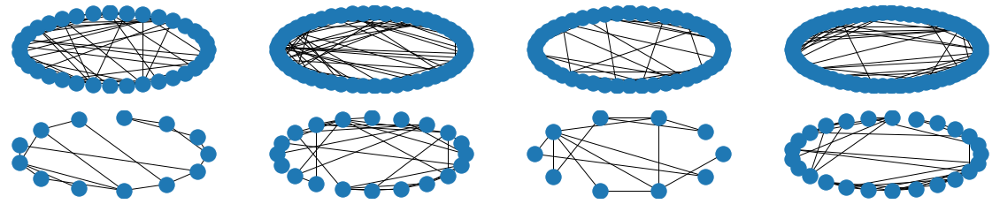

DeepGG model instance "deepgg-t1589299411-metadata-generate_seqs_watts_strogatz_dfs.json"


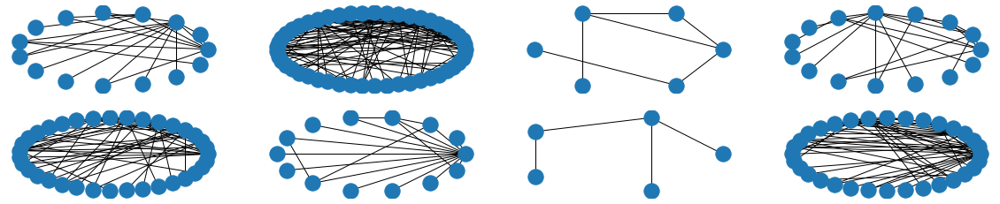

DeepGG model instance "deepgg-t1589365179-metadata-generate_seqs_watts_strogatz_dfs.json"


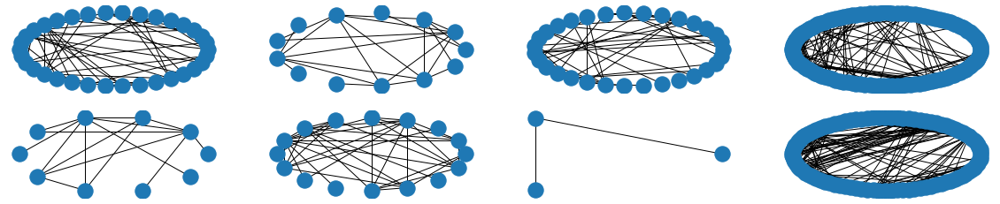

DeepGG model instance "deepgg-t1590574322-metadata-generate_seqs_watts_strogatz_bfs.json"


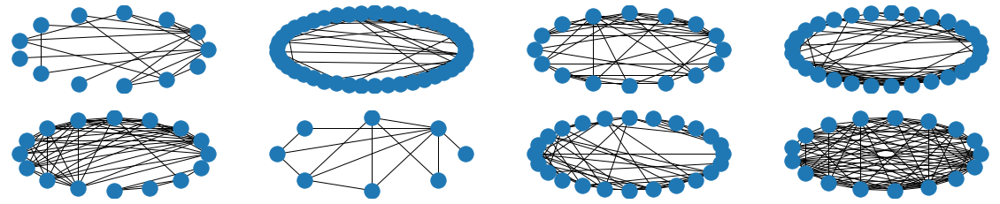

DeepGG model instance "deepgg-t1589810142-metadata-generate_seqs_watts_strogatz_bfs.json"


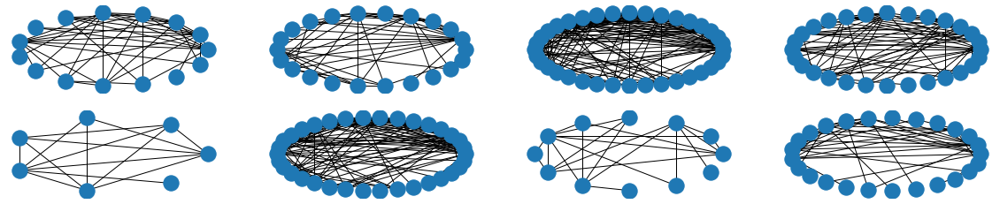

DeepGG model instance "deepgg-t1590680731-metadata-generate_seqs_watts_strogatz_dfs.json"


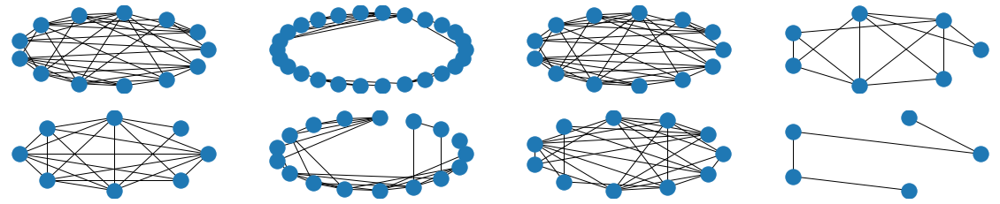

DeepGG model instance "deepgg-t1590175786-metadata-generate_seqs_watts_strogatz_dfs.json"


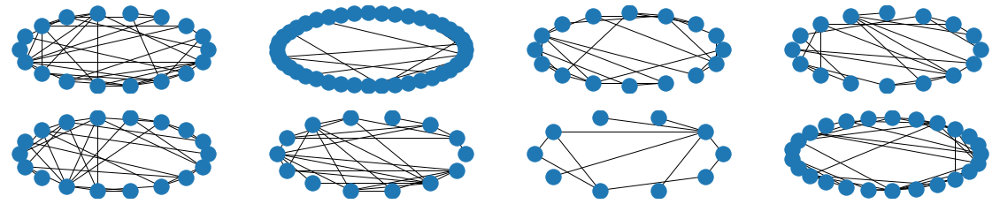

DeepGG model instance "deepgg-t1590408181-metadata-generate_seqs_watts_strogatz_bfs.json"


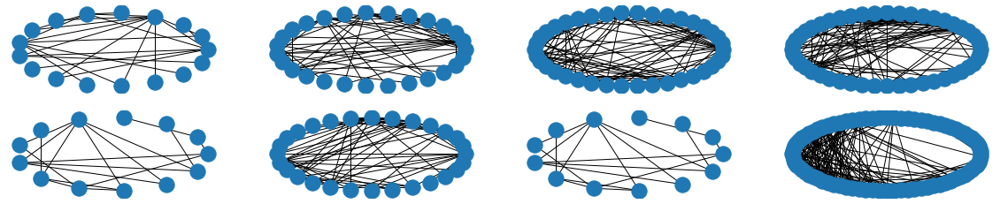

DeepGG model instance "deepgg-t1589810059-metadata-generate_seqs_watts_strogatz_dfs.json"


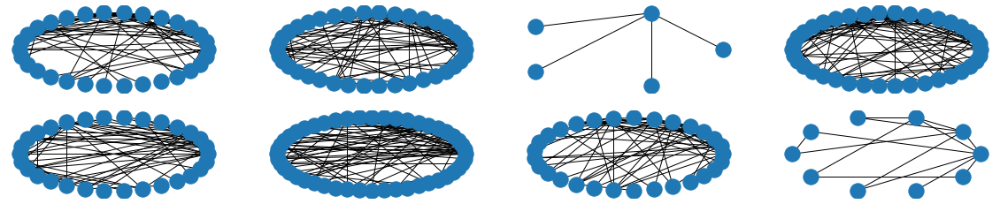

In [16]:
plot_samples(keys_watts_strogatz, layout=layout_circular)

DeepGG model instance "deepgg-t1590408056-metadata-generate_seqs_erdos_renyi_bfs.json"


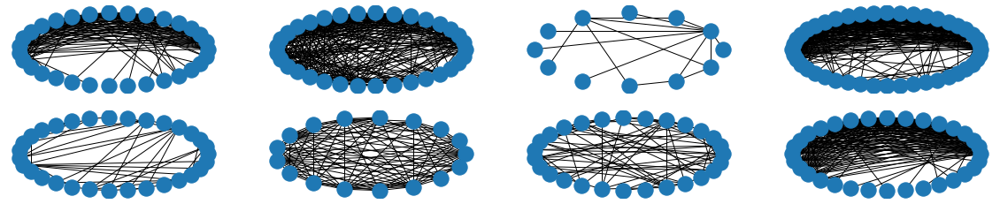

DeepGG model instance "deepgg-t1590414058-metadata-generate_seqs_erdos_renyi_bfs.json"


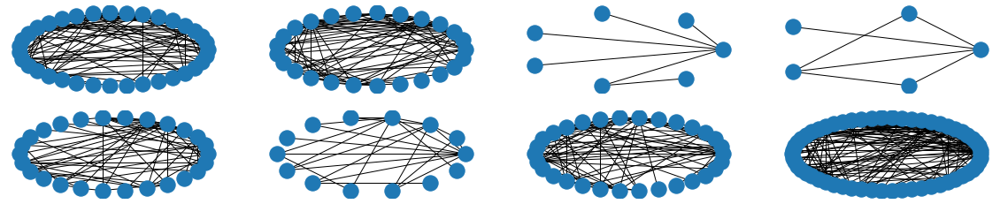

DeepGG model instance "deepgg-t1590574301-metadata-generate_seqs_erdos_renyi_bfs.json"


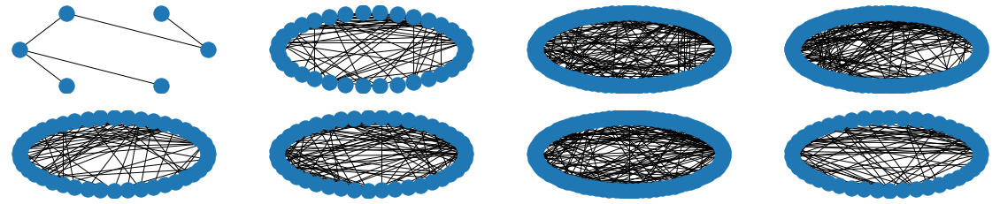

DeepGG model instance "deepgg-t1589810207-metadata-generate_seqs_erdos_renyi_dfs.json"


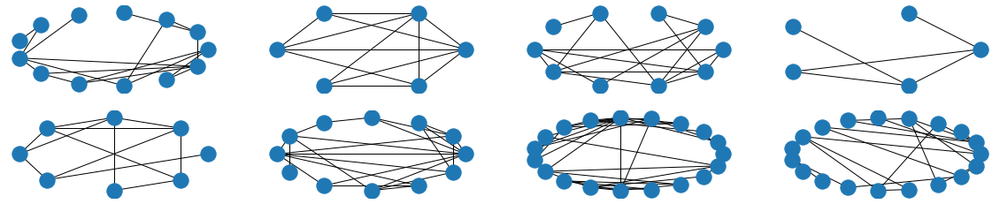

DeepGG model instance "deepgg-t1590408105-metadata-generate_seqs_erdos_renyi_dfs.json"


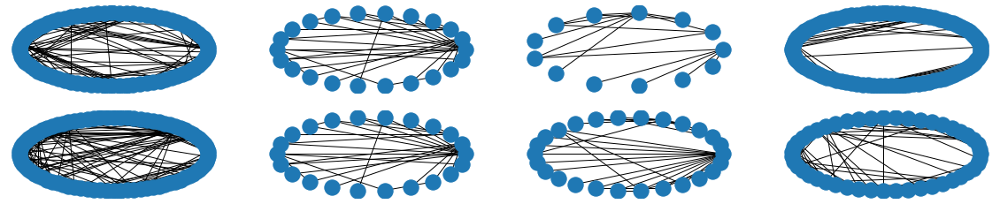

DeepGG model instance "deepgg-t1590414067-metadata-generate_seqs_erdos_renyi_bfs.json"


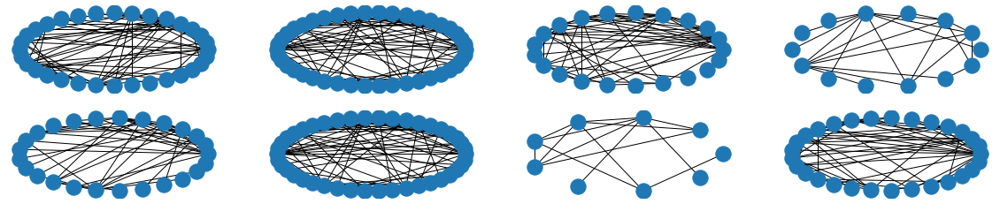

DeepGG model instance "deepgg-t1590574307-metadata-generate_seqs_erdos_renyi_dfs.json"


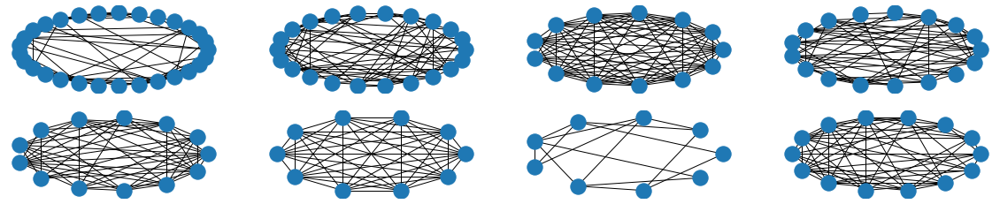

DeepGG model instance "deepgg-t1590414191-metadata-generate_seqs_erdos_renyi_dfs.json"


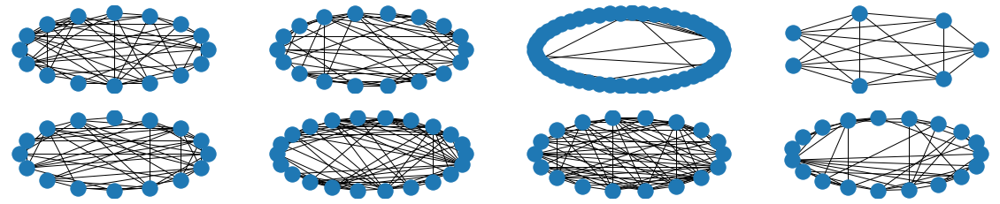

DeepGG model instance "deepgg-t1590680742-metadata-generate_seqs_erdos_renyi_bfs.json"


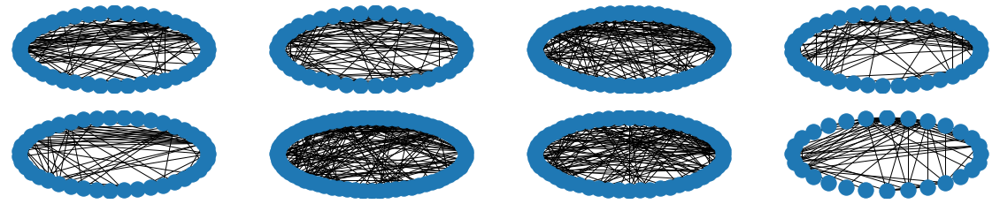

DeepGG model instance "deepgg-t1590408101-metadata-generate_seqs_erdos_renyi_dfs.json"


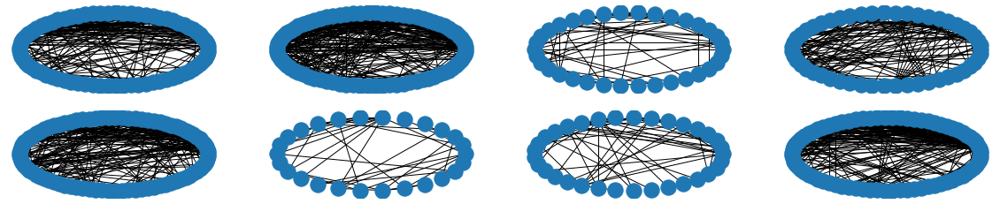

DeepGG model instance "deepgg-t1589299334-metadata-generate_seqs_erdos_renyi_bfs.json"


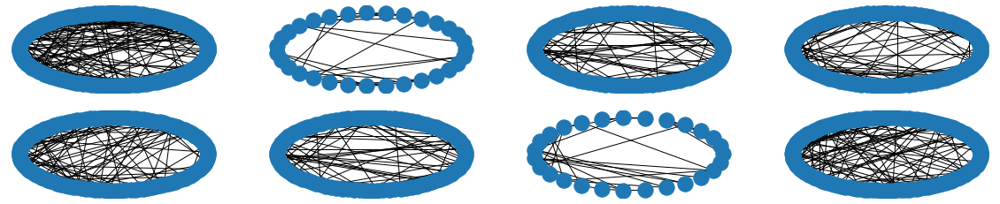

DeepGG model instance "deepgg-t1589299418-metadata-generate_seqs_erdos_renyi_dfs.json"


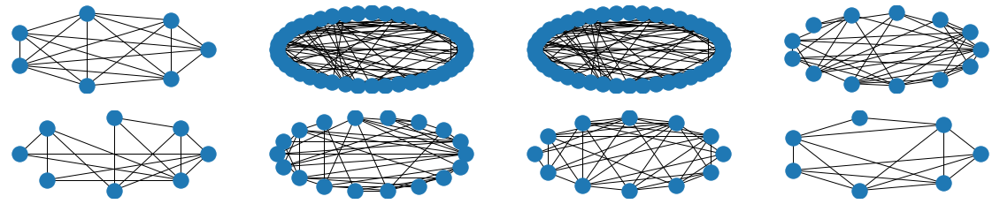

DeepGG model instance "deepgg-t1590408015-metadata-generate_seqs_erdos_renyi_bfs.json"


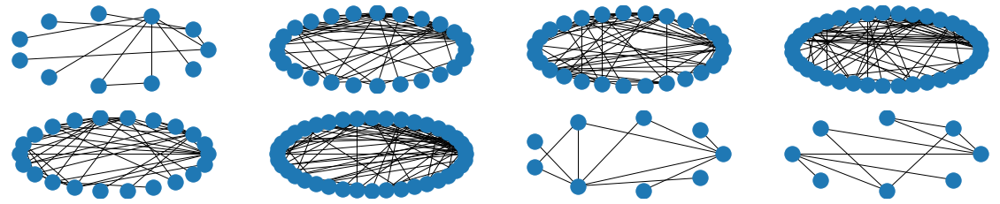

DeepGG model instance "deepgg-t1590680714-metadata-generate_seqs_erdos_renyi_dfs.json"


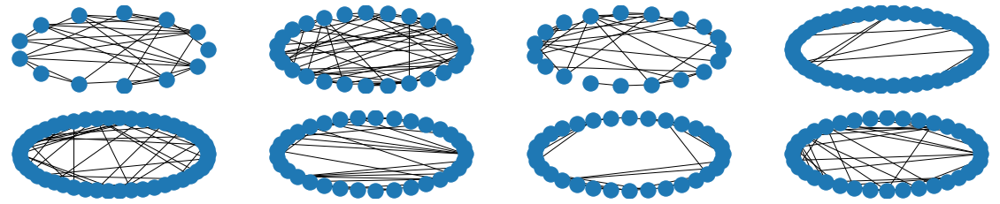

DeepGG model instance "deepgg-t1590680750-metadata-generate_seqs_erdos_renyi_bfs.json"


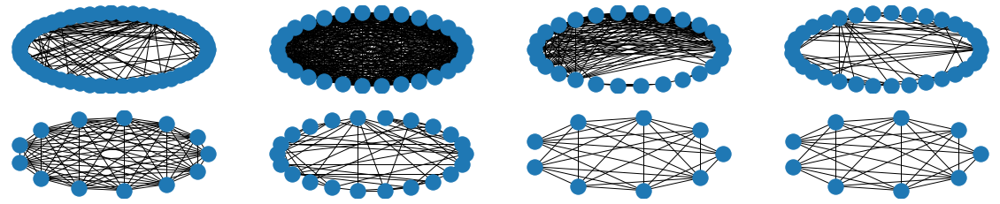

DeepGG model instance "deepgg-t1589299414-metadata-generate_seqs_erdos_renyi_dfs.json"


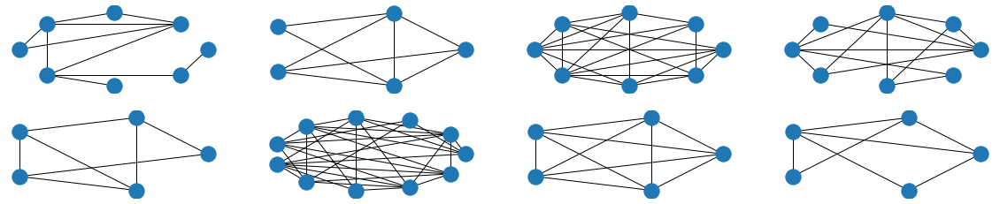

DeepGG model instance "deepgg-t1589810150-metadata-generate_seqs_erdos_renyi_dfs.json"


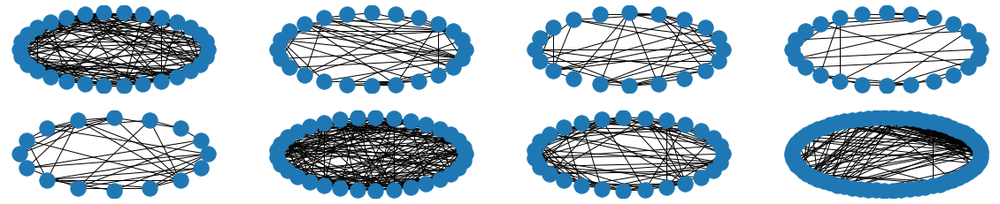

DeepGG model instance "deepgg-t1590680737-metadata-generate_seqs_erdos_renyi_bfs.json"


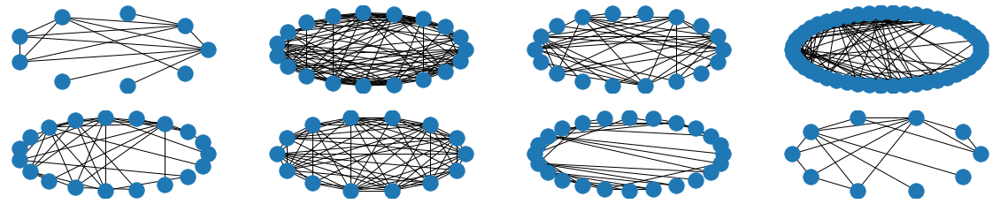

DeepGG model instance "deepgg-t1590680725-metadata-generate_seqs_erdos_renyi_bfs.json"


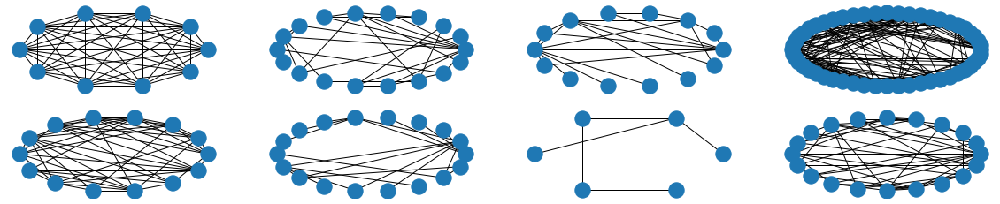

DeepGG model instance "deepgg-t1589299796-metadata-generate_seqs_erdos_renyi_bfs.json"


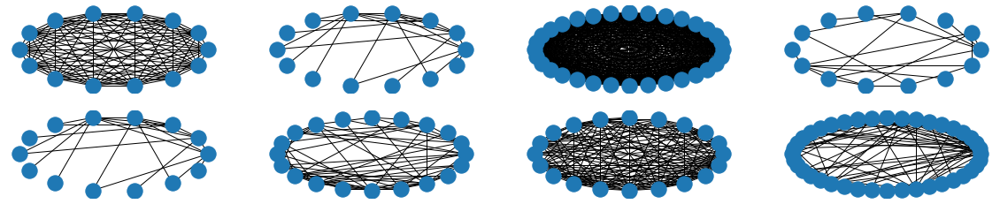

DeepGG model instance "deepgg-t1589299409-metadata-generate_seqs_erdos_renyi_dfs.json"


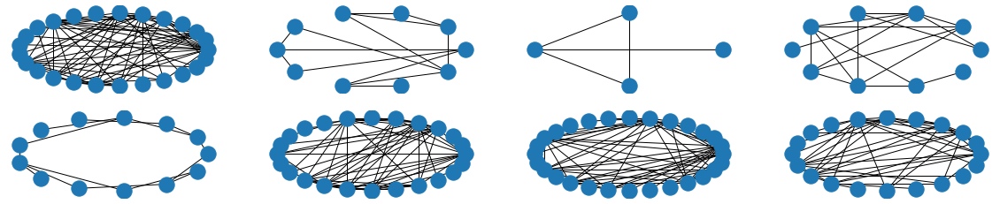

DeepGG model instance "deepgg-t1589473382-metadata-generate_seqs_erdos_renyi_dfs.json"


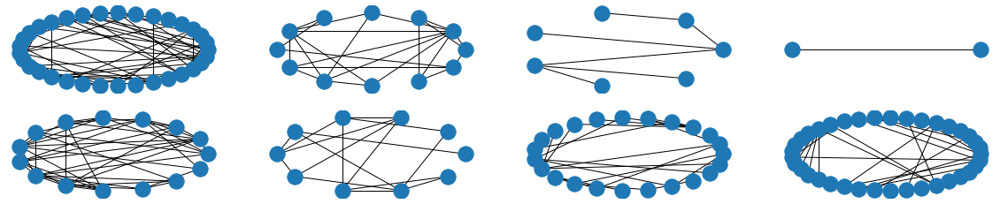

DeepGG model instance "deepgg-t1589810063-metadata-generate_seqs_erdos_renyi_bfs.json"


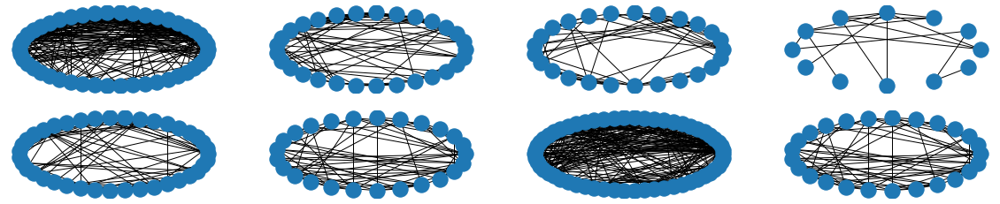

DeepGG model instance "deepgg-t1589810061-metadata-generate_seqs_erdos_renyi_bfs.json"


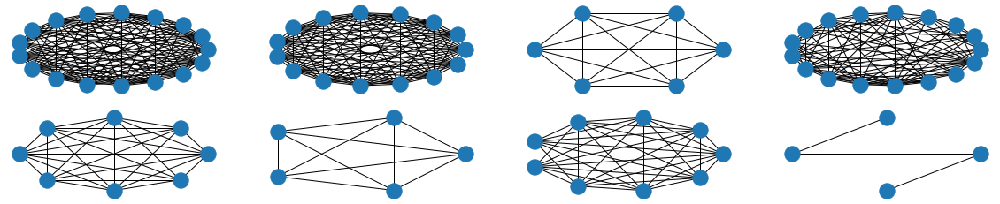

In [15]:
plot_samples(keys_erdos_renyi, layout=layout_circular)